## Quick and Dirty Strain Analysis

In [1]:
import numpy as np
import h5py
import hdf5plugin
import os
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb
from matplotlib.ticker import FormatStrFormatter
import numba
import os
%matplotlib ipympl

In [2]:
 def wrapTo2pi(x):
    """
    Python implementation of Matlab method `wrapTo2pi`.
    Wraps angles in x, in radians, to the interval [0, 2*pi] such that 0 maps
    to 0 and 2*pi maps to 2*pi. In general, positive multiples of 2*pi map to
    2*pi and negative multiples of 2*pi map to 0.
    """
    xwrap = np.remainder(x - np.pi, 2 * np.pi)
    mask = np.abs(xwrap) > np.pi
    xwrap[mask] -= 2 * np.pi * np.sign(xwrap[mask])
    return xwrap + np.pi

In [3]:
# Constants
layerNumber = 1
motor_chi = 'phi'
energyMotor = 'ccmth'
detector = 'pco_ff' 


experimentAbsPath = '/data/visitor/hc5803/id03/20241105/RAW_DATA'
sample = '/110_5pct_020_4_'

#find all layer scans
layerBaseName = "layer_"
directoriesInExperiment = os.listdir(experimentAbsPath)
scanLayers = np.array([layer for layer in directoriesInExperiment if sample[1:]+layerBaseName in layer])
layerIndex = np.array([index.split("_")[-1] for index in scanLayers]).astype(int)
scanLayers = scanLayers[layerIndex.argsort()]
print(scanLayers)

datasetAbsPath = experimentAbsPath + '/' +scanLayers[layerNumber]
datasetH5File = [cont for cont in os.listdir(datasetAbsPath) if '.h5' in cont]
assert len(datasetH5File) == 1
datasetH5File = datasetH5File[0]
datasetH5FileAbsPath = datasetAbsPath + '/' + datasetH5File
print(datasetH5FileAbsPath)


['110_5pct_020_4_layer_0' '110_5pct_020_4_layer_1'
 '110_5pct_020_4_layer_2' '110_5pct_020_4_layer_3']
/data/visitor/hc5803/id03/20241105/RAW_DATA/110_5pct_020_4_layer_1/hc5803_110_5pct_020_4_layer_1.h5


### Read in H5Data

In [4]:
#open h5 file
verbose = True
energyChiScans = []
chis = []
angles = []
with h5py.File(datasetH5FileAbsPath, 'r') as h5f:
    energyKeys = h5f.keys()
    # only keep '.1' datasets
    energyKeys = [energyKey for energyKey in energyKeys if ".1" in energyKey]
    
    # Visit energyKeys
    for energyKey in energyKeys:
        energyScanH5f = h5f[energyKey]
        chis = energyScanH5f['instrument'][motor_chi]['value'][:]
        chis = np.unique(np.round(chis, 2))
        angles.append(energyScanH5f['instrument']['positioners'][energyMotor][()])
                        
        energyChiScan = energyScanH5f['instrument'][detector]["data"][:]
        energyChiScans.append(energyChiScan)

### Convert ccmth to Energy

In [5]:
angles = np.round(angles, 4)
dSI111 = 3.1355e-10
wavelength = 2*dSI111*np.sin(np.deg2rad(angles))* 1e9
e = 1239.8  / wavelength * 1e-3
strain = (e-np.mean(e))/np.mean(e)


In [6]:
# concatenate energyChiScans
energyChiScans = np.array(energyChiScans)
print("energyChiScan shape: "+str(energyChiScans.shape))

energyChiScan shape: (9, 18, 2048, 2048)


### Basic BackgroundSubstration

In [7]:
backgroundValue = 105 
energyChiScans.clip(backgroundValue, None, out=energyChiScans)
energyChiScans-=backgroundValue

In [8]:
energy = energyChiScans.sum(axis=1)

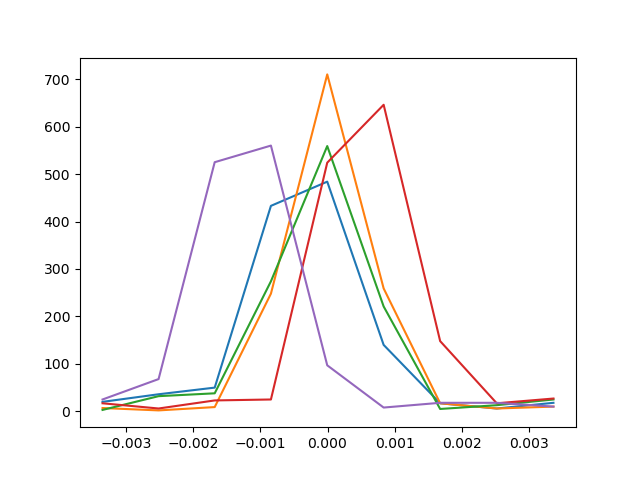

In [9]:
plt.figure()
plt.plot(strain, energy[:, 1000, 1000])
plt.plot(strain, energy[:, 1200, 1000])
plt.plot(strain, energy[:, 1000, 1100])
plt.plot(strain, energy[:, 1600, 1000])
plt.plot(strain, energy[:, 400, 1000])

plt.show()

### CoM 

In [10]:
totalIntensity = np.sum(energyChiScans, axis=(0,1), dtype=np.float32 )
minIntensity = 1e-4
totalIntensity.clip(minIntensity, None, out=totalIntensity)

comEnergy = np.sum((np.sum(energyChiScans, axis = 1)*strain[:,np.newaxis,np.newaxis]), axis = 0)/totalIntensity
comChi = np.sum((np.sum(energyChiScans, axis = 0)*chis[:,np.newaxis,np.newaxis]), axis = 0)/totalIntensity

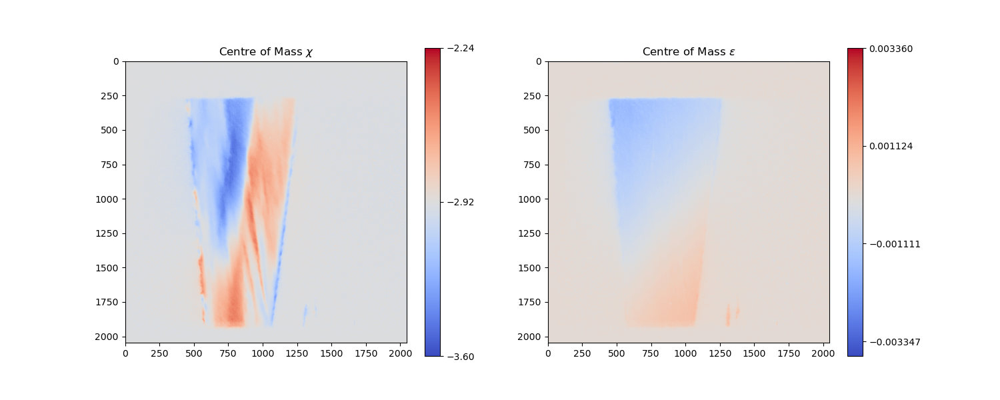

In [11]:

fig, axs = plt.subplots(1,2, figsize=(15, 6))
d1 = axs[0].imshow(comChi, vmin = chis[0], vmax = chis[-1], cmap="coolwarm")
axs[0].set_title(r'Centre of Mass $\chi$')
d2 = axs[1].imshow(comEnergy, vmin = strain[0], vmax = strain[-1], cmap="coolwarm")
axs[1].set_title(r'Centre of Mass $\varepsilon$')
cbar1 = fig.colorbar(d1, ax=axs[0])
cbar1.set_ticks(np.linspace(chis[0],chis[-1],len(chis) // 5))
cbar2 = fig.colorbar(d2, ax=axs[1])
cbar2.set_ticks(np.linspace(strain[0],strain[-1],len(strain) // 2))

In [1]:

xg = np.arange(comEnergy.shape[0])
X,Y = np.meshgrid(xg, xg, indexing='ij')
fitting_range = 300,1800, 700,1000

r1,r2,c1,c2 = fitting_range
size = X[r1:r2,c1:c2].shape
x_1d = X[r1:r2,c1:c2].reshape((1, np.prod(size)))
y_1d = Y[r1:r2,c1:c2].reshape((1, np.prod(size)))
xdata = np.vstack((x_1d, y_1d))
ydata = comEnergy[r1:r2,c1:c2].flatten()



NameError: name 'np' is not defined

In [2]:
def func(x, A, B, C, D, E, F): return A*np.arctan((x[0]*B + C)/(x[1]*D + E)) + F
from scipy.optimize import curve_fit
p0 = np.array([  0.1077562348324897,
                 -0.7275480470572874,
                 4256.842806458931,
                 -11.90216040944949,
                 -48840.40452014715,
                 0.006007641252352692 ])
bounds = ( np.array([p - np.abs(p) for p in p0]),  np.array([p + np.abs(p) for p in p0]) )
A, B, C, D, E, F = curve_fit(func, xdata, ydata, p0=p0, bounds=bounds, maxfev=12000)[0]
def correction_function(x, y): return -(A*np.arctan((x*B + C)/(y*D + E)) + F)

NameError: name 'np' is not defined

In [108]:
def correction_function(x, y): return -(A*np.arctan((x*B + C)/(y*D + E)) + F)

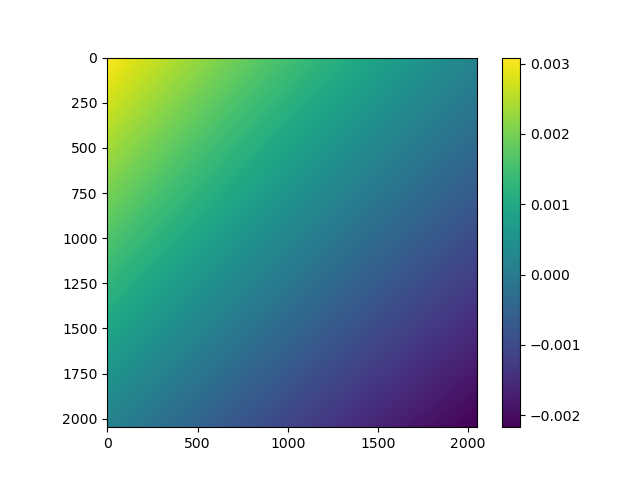

In [109]:
xg = np.arange(comEnergy.shape[0])
X,Y = np.meshgrid(xg, xg, indexing='ij')
plt.figure()
plt.imshow(correction_function(X,Y))
plt.colorbar()
plt.show()


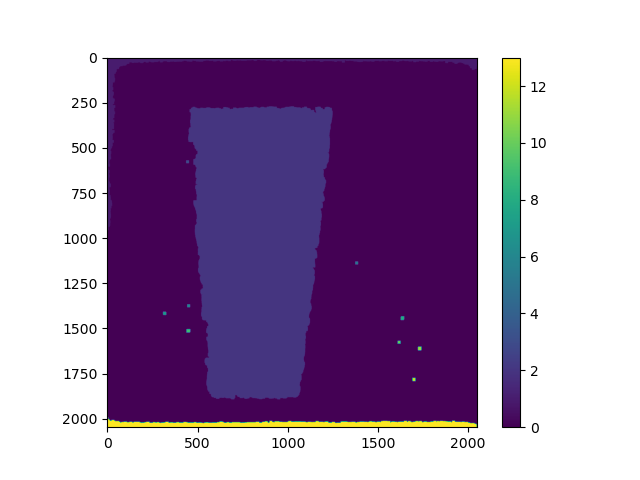

In [151]:
from scipy.ndimage import label, binary_erosion, binary_fill_holes, binary_dilation
mask = totalIntensity > 900
mask = binary_erosion(mask, structure=np.ones((2,2)), iterations=3)
mask = binary_dilation(mask, structure=np.ones((2,2)), iterations=15)
mask = binary_fill_holes(mask)
lmask, _ = label(mask)
plt.figure()
plt.imshow(lmask)
plt.colorbar()
plt.show()

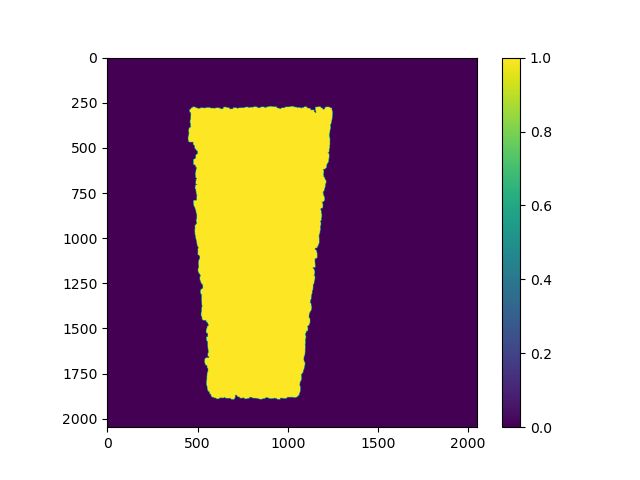

In [152]:
s = [np.sum(lmask==label) for label in np.unique(lmask.flatten())[1:]]
mask = lmask==np.unique(lmask)[1:][np.argmax(s)]
plt.figure()
plt.imshow( mask )
plt.colorbar()
plt.show()

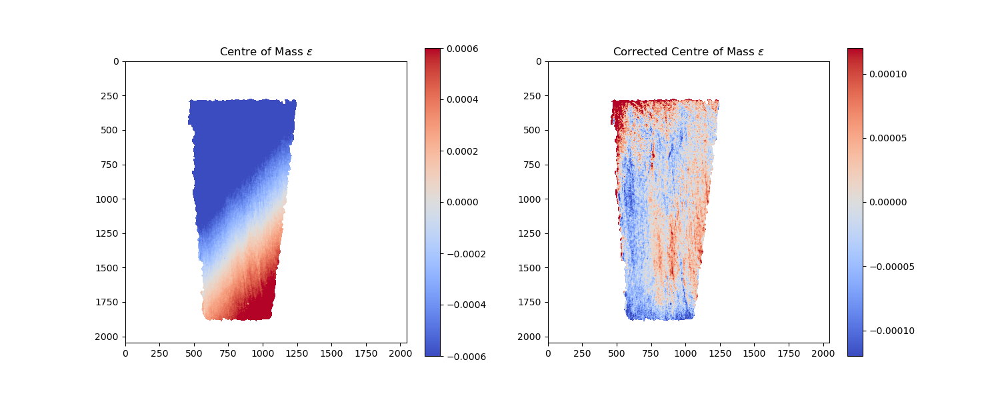

In [158]:
fig, axs = plt.subplots(1,2, figsize=(15, 6))
corrected_comEnergy = comEnergy + correction_function(X,Y)
corrected_comEnergy[~mask]=np.nan
ss = comEnergy.copy()
ss[~mask]=np.nan
d1 = axs[0].imshow(ss, vmin = -6*1e-4, vmax = 6*1e-4, cmap="coolwarm")
axs[0].set_title(r'Centre of Mass $\varepsilon$')
d2 = axs[1].imshow(corrected_comEnergy, vmin = -12*1e-5, vmax = 12*1e-5, cmap="coolwarm")
axs[1].set_title(r'Corrected Centre of Mass $\varepsilon$')
cbar1 = fig.colorbar(d1, ax=axs[0])
cbar2 = fig.colorbar(d2, ax=axs[1])

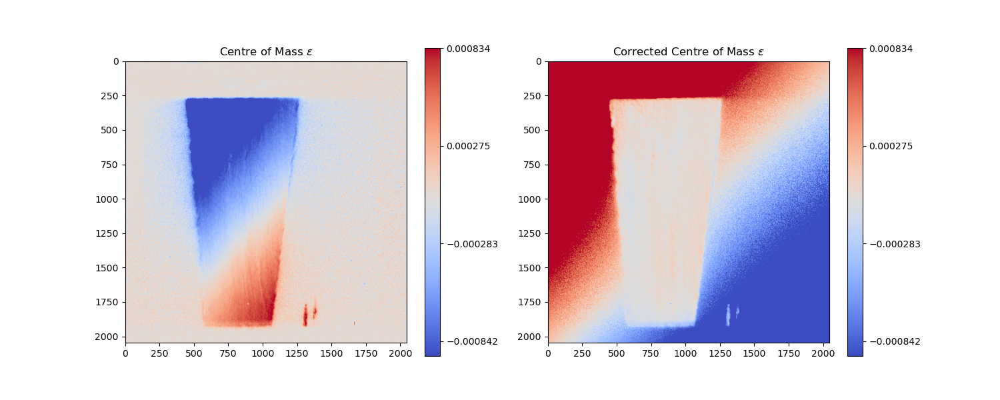

In [110]:
fig, axs = plt.subplots(1,2, figsize=(15, 6))
d1 = axs[0].imshow(comEnergy, vmin = strain[3], vmax = strain[-4], cmap="coolwarm")
axs[0].set_title(r'Centre of Mass $\varepsilon$')
corrected_comEnergy = comEnergy + correction_function(X,Y)
d2 = axs[1].imshow(corrected_comEnergy, vmin = strain[3], vmax = strain[-4], cmap="coolwarm")
axs[1].set_title(r'Corrected Centre of Mass $\varepsilon$')
cbar1 = fig.colorbar(d1, ax=axs[0])
cbar1.set_ticks(np.linspace(strain[3],strain[-4],len(strain) // 2))
cbar2 = fig.colorbar(d2, ax=axs[1])
cbar2.set_ticks(np.linspace(strain[3],strain[-4],len(strain) // 2))

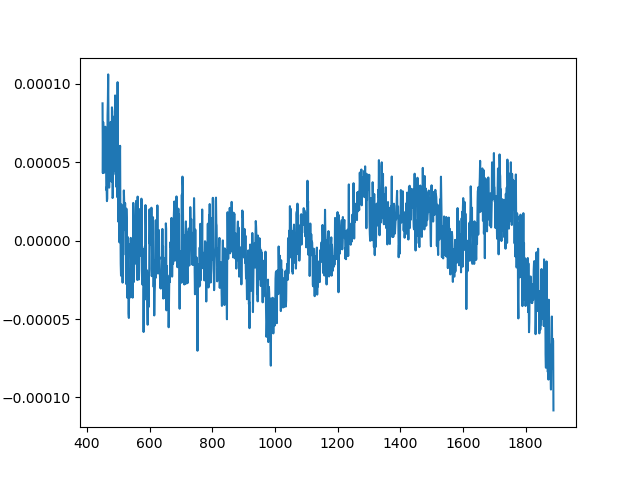

In [41]:
xdata = np.arange(corrected_comEnergy.shape[0])[450:1890]
ydata = np.mean( corrected_comEnergy[450:1890, 800 - 10: 800 + 10], axis=1 )
plt.figure()
plt.plot(xdata, ydata)
plt.show()

### Correction Strain Gradient

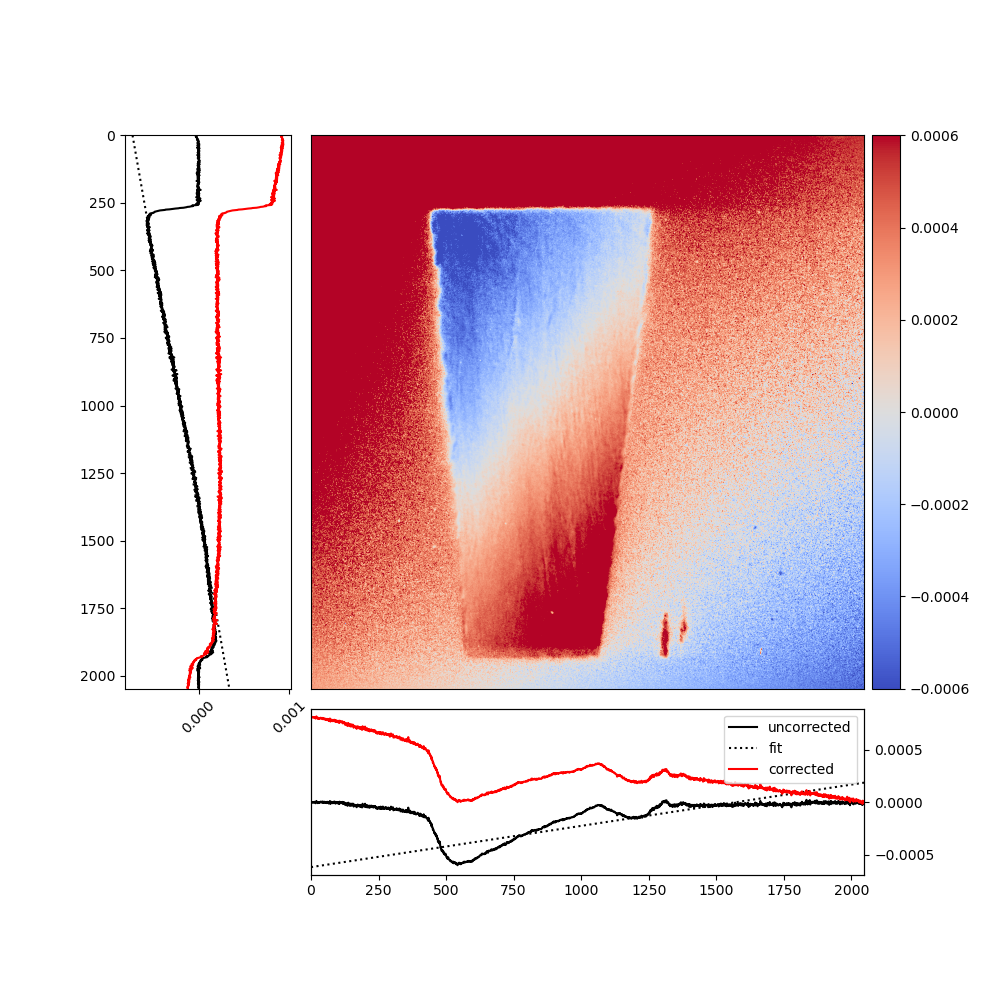

In [14]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
energyProjectionX = np.mean(comEnergy, axis = 1)
energyProjectionY = np.mean(comEnergy, axis = 0)

fittingIntervalX = np.sort([np.argmin(energyProjectionX), np.argmax(energyProjectionX)])
fittingRangeX = np.arange(fittingIntervalX[0], fittingIntervalX[1])
coeffsX = np.polyfit(fittingRangeX, energyProjectionX[fittingIntervalX[0]:fittingIntervalX[1]], 1)
fitX = coeffsX[0]*np.arange(comEnergy.shape[0])+coeffsX[1]

fittingIntervalY = np.sort([np.argmin(energyProjectionY), np.argmax(energyProjectionY)])
fittingRangeY = np.arange(fittingIntervalY[0], fittingIntervalY[1])
coeffsY = np.polyfit(fittingRangeY, energyProjectionY[fittingIntervalY[0]:fittingIntervalY[1]], 1)
fitY = coeffsY[0]*np.arange(comEnergy.shape[1])+coeffsY[1]

comEnergyCorrected = comEnergy - fitX[:,np.newaxis] - fitY[np.newaxis, :]

#fig, axs = plt.subplots(2,2, figsize=(10, 10), gridspec_kw={'width_ratios': [1, 4], 'height_ratios' : [4,1]})

fig = plt.figure(figsize=(10, 10))
ax1 = plt.subplot(111)



d1 = ax1.imshow(comEnergyCorrected,cmap="coolwarm", vmin = -6e-4, vmax = 6e-4)
ax1.set_xticks([])
ax1.set_yticks([])
divider = make_axes_locatable(ax1)

axBottom = divider.append_axes("bottom", size="30%", pad=0.2)
axLeft = divider.append_axes("left", size="30%", pad=0.2)
cax = divider.append_axes("right", size="5%", pad=0.08)

axLeft.plot(energyProjectionX, np.arange(comEnergy.shape[0]), label =  'uncorrected', color = "black")
axLeft.plot(fitX, np.arange(comEnergy.shape[0]), label =  'fit', color = "black", linestyle = ":")
axLeft.plot(np.mean(comEnergyCorrected, axis = 1), np.arange(comEnergy.shape[0]), label =  'corrected', color = "red")
axLeft.tick_params(axis='x', rotation=45)
axLeft.set_ylim((comEnergyCorrected.shape[0],0))

axBottom.set_yticks([])
axBottomRight = axBottom.twinx()
axBottomRight.plot(energyProjectionY, label =  'uncorrected' , color = "black")
axBottomRight.plot(np.arange(comEnergy.shape[1]), fitY, label =  'fit', color = "black", linestyle = ":")
axBottomRight.plot(np.mean(comEnergyCorrected, axis = 0), label =  'corrected', color = "red")
axBottomRight.legend()
axBottom.set_xlim((0, comEnergyCorrected.shape[1]))



cbar1 = plt.colorbar(d1, ax=ax1, cax = cax)


In [43]:
(53*1e-9)*2000*1e6

106.00000000000001

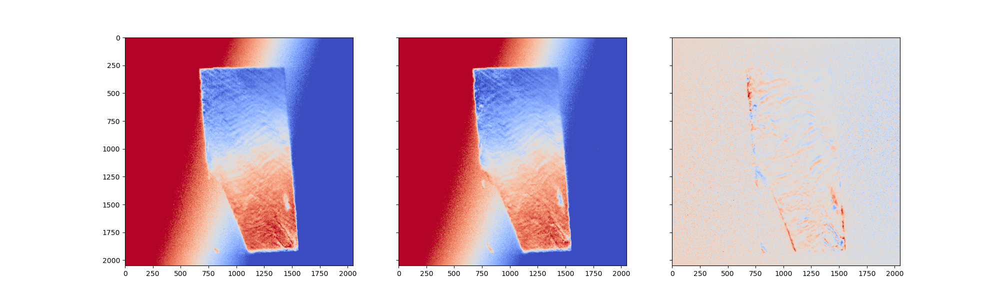

In [32]:
#comStep5 = comEnergyCorrected.copy()
fig, axs = plt.subplots(1,3, figsize=(20, 6), sharex = True, sharey = True)
axs[0].imshow(comStep5,cmap="coolwarm", vmin = -6e-4, vmax = 6e-4)
axs[1].imshow(comEnergyCorrected,cmap="coolwarm", vmin = -6e-4, vmax = 6e-4)
axs[2].imshow(comStep5-comEnergyCorrected,cmap="coolwarm", vmin = -6e-4, vmax = 6e-4)

In [34]:
6e-4 * 70e3

41.99999999999999

In [11]:
# Constants

experimentPath = '/data/visitor/hc5803/id03/20241105/RAW_DATA'
sample = '/110_5pct_'

#dataset = '_range_finder'
dataset = '_range_finder'

motor_phi = 'diffrz'#'diffry'#'diffrz'
motor_chi = 'chi'
    
datasetAbsPath = experimentPath + sample + sample + dataset
datasetH5File = sample + dataset + '.h5'
datasetH5FileAbsPath = datasetAbsPath + datasetH5File

# define scan id the layer in y
scanID = 5

print('dataset folder contains:')
print(os.listdir(datasetAbsPath))

print('searching for:')
print(datasetH5FileAbsPath)
if os.path.isfile(datasetH5FileAbsPath):
    print('h5 file could be found')
else: print('ERROR! h5 file does not exist!!')
    


dataset folder contains:


FileNotFoundError: [Errno 2] No such file or directory: '/data/visitor/hc5803/id03/20241105/RAW_DATA/110_5pct_/110_5pct__range_finder'

In [ ]:
chis = np.unique(np.round(chish5, 2))
phis = np.unique(np.round(phish5, 2))

In [ ]:
#open h5 file
with h5py.File(datasetH5FileAbsPath, 'r') as h5f:
    # go to scan id ie the layer in y
    scanIdString = str(scanID)+".1"
    h5scan = h5f[scanIdString]
    # load pco_ff data
    chi_phi_framestack = h5scan['instrument']['pco_ff']['image'][:,:,:]

### Flip Axes and rearrange array to [chi, phi, x, y]

In [7]:
print('data shape is: '+str(chi_phi_framestack.shape))
#reshuffleImage to phi and chi.
chi_phi_framestack = chi_phi_framestack.reshape((len(chis),len(phis),2048,2048))
print(chi_phi_framestack.shape)

data shape is: (3999, 2048, 2048)
(93, 43, 2048, 2048)


### Do some basic Background Substraction

In [8]:
# converto float
#pco_ffDataReshaped = pco_ffDataReshaped.astype(np.float32)
backgroundValue = 105 + 5 + 12
chi_phi_framestack.clip(backgroundValue, None, out=chi_phi_framestack)
chi_phi_framestack-=backgroundValue
print('done')
#mask = np.zeros_like(pco_ffDataReshaped)
#pco_ffDataReshaped -= backgroundValue
#imageThreshold = np.maximum(pco_ffDataReshaped, mask)
#del pco_ffDataReshaped


done


In [9]:
@numba.guvectorize([(numba.float64[:, :], numba.float64[:,:], numba.float64[:,:], numba.float64[:,:], numba.float64[:], numba.float64[:,:])], '(n,m),(n,m),(n,m),(k,q),(p)->(p,p)', nopython=True, target='parallel')
def tobecov(chi_phi, chis, phis, points, dum, res):
    I = np.sum(chi_phi)
    if I==0:
        res[...] = np.zeros((2,2))
    else:
        #print(chi_phi.shape, chis.shape)
        coordchi=chi_phi*chis
        cchi = np.sum(coordchi) 
        mean_chi = cchi / I
        coordphi=chi_phi*phis
        cphi = np.sum(coordphi)
        mean_phi = cphi / I

        m = points.copy()
        m[0] -= mean_chi
        m[1] -= mean_phi
        
        a = chi_phi.flatten()
        m -= np.sum(m * a) / I
        cov = np.dot(m * a, m.T) / I

        res[...] = cov

In [10]:
sd = chi_phi_framestack[:, :, :, :].astype(np.float64)
sd = sd.swapaxes(0, 2)
sd = sd.swapaxes(1,-1)
import time

In [11]:
CHI, PHI = np.meshgrid(chis, phis, indexing='ij')
CHI = CHI.astype(np.float64)
PHI = PHI.astype(np.float64)
points = np.array([CHI.flatten(), PHI.flatten()]).astype(np.float64)

In [12]:
t1 = time.perf_counter()
res = np.zeros((sd.shape[0], sd.shape[1], 2, 2), dtype=np.float64)
dum = np.arange(2).astype(np.float64)
cov = tobecov(sd, CHI, PHI, points, dum, res)
t2 = time.perf_counter()
print(t2-t1)

32.47273869533092


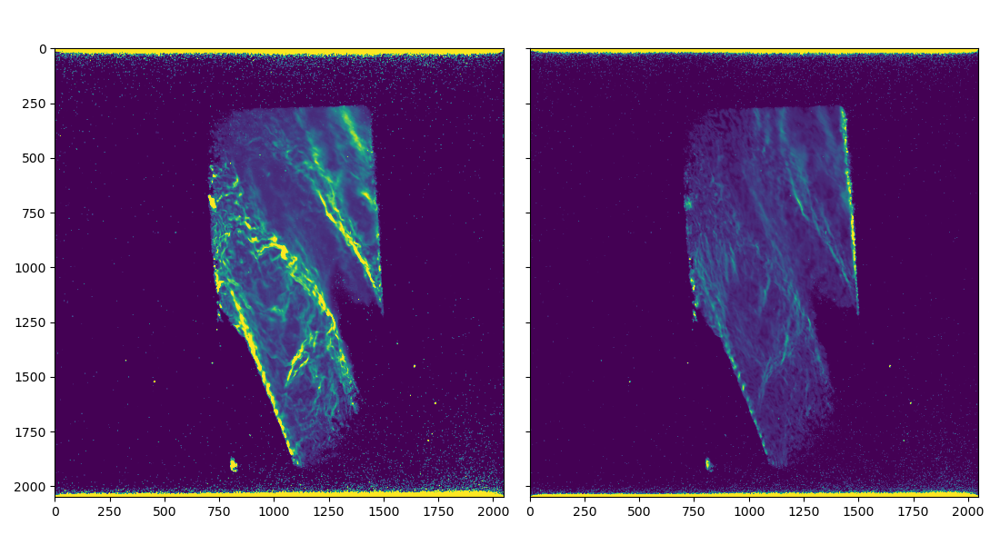

In [13]:
fig, ax = plt.subplots(1, 2, figsize=(11, 6), sharex=True, sharey=True)
ax[0].imshow(np.sqrt(cov[:, :, 0 ,0])*2.345, vmax=0.8)
ax[1].imshow(np.sqrt(cov[:, :, 1 ,1])*2.345, vmax=0.8)
#ax[2].imshow(cov[:, :, 0 ,1]*2.345)
plt.tight_layout()
plt.show()

In [14]:
data = chi_phi_framestack[:, :, 900:1100, 900:1100].astype(np.float64)
dx = np.gradient(data, axis=2)
dy = np.gradient(data, axis=3)

In [15]:
grad_mag = dx*dx + dy*dy
contrast_map = grad_mag.sum(axis=(0,1))

In [16]:
contrast_map.shape

(200, 200)

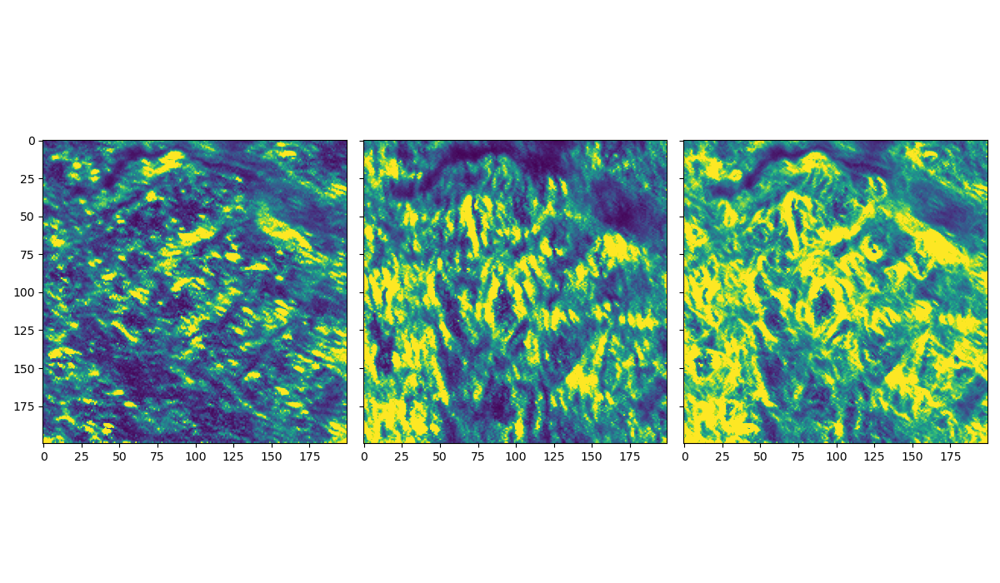

In [17]:
fig, ax = plt.subplots(1, 3, figsize=(12, 7), sharex=True, sharey=True)
dx2 = (dx*dx).sum(axis=(0,1))
dy2 = (dy*dy).sum(axis=(0,1))
ax[0].imshow(dx2, vmin=0, vmax=dx2.max()/4.)
ax[1].imshow(dy2, vmin=0, vmax=dy2.max()/4.)
ax[2].imshow(contrast_map, vmin=0, vmax=contrast_map.max()/4.)
plt.tight_layout()
plt.show()

NameError: name 'comChi' is not defined

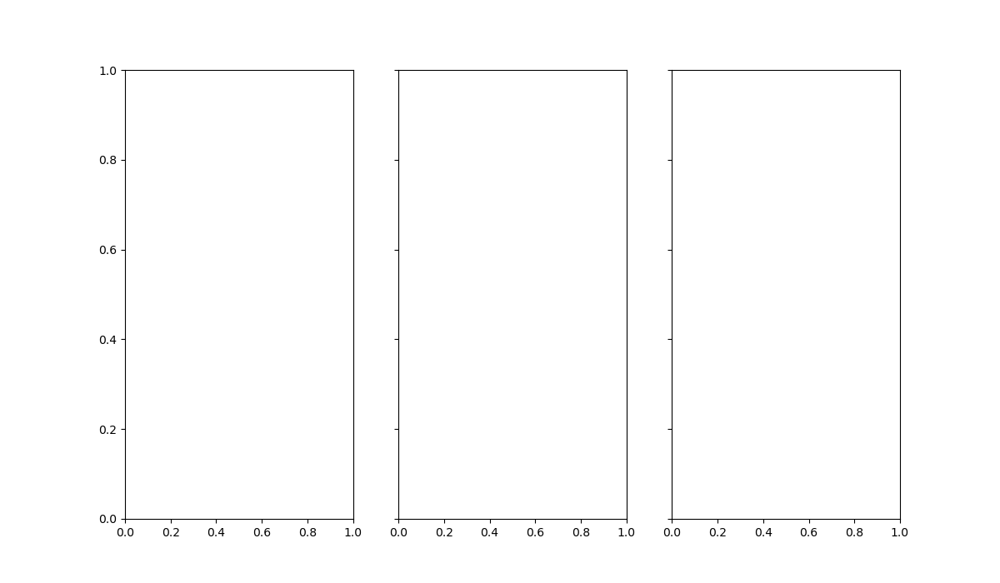

In [18]:
fig, ax = plt.subplots(1, 3, figsize=(12, 7), sharex=True, sharey=True)
ax[0].imshow(comChi[900:1400, 900:1400], vmin=0, vmax=comChi.max()/4.)
ax[1].imshow(comPhi[900:1400, 900:1400], vmin=0, vmax=comChi.max()/4.)
ax[2].imshow(contrast_map, vmin=0, vmax=contrast_map.max()/4.)
plt.tight_layout()
plt.show()

In [ ]:
plt.figure()
totalIntensity = np.sum(chi_phi_framestack, axis=(0,1), dtype=np.float32 )
plt.imshow(totalIntensity[:,:])
plt.show()

### CoM identification

In [ ]:
totalIntensity = np.sum(chi_phi_framestack, axis=(0,1), dtype=np.float32 )
minIntensity = 1e-4
totalIntensity.clip(minIntensity, None, out=totalIntensity)

comChi = np.sum((np.sum(chi_phi_framestack, axis = 1)*chis[:,np.newaxis,np.newaxis]), axis = 0)/totalIntensity
comPhi = np.sum((np.sum(chi_phi_framestack, axis = 0)*phis[:,np.newaxis,np.newaxis]), axis = 0)/totalIntensity

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(10, 5))
d1 = axs[0].imshow(comChi, vmin = chis[0], vmax = chis[-1], cmap = "jet")
axs[0].set_title(r'Centre of Mass $\chi$')
d2 = axs[1].imshow(comPhi, vmin = phis[1], vmax = phis[-2], cmap = "jet")
axs[1].set_title(r'Centre of Mass $\varphi$')
cbar1 = fig.colorbar(d1, ax=axs[0])
cbar1.set_ticks(np.linspace(chis[0],chis[-1],len(chis) // 2))
cbar2 = fig.colorbar(d2, ax=axs[1])
cbar2.set_ticks(np.linspace(phis[0],phis[-1],len(phis) // 2))

### Mosaicity

In [ ]:
 # Generate Color Map
phisMap = np.linspace(-1, 1, 400) 
chisMap = np.linspace(-1, 1, 400)
meshgrid = np.meshgrid(phisMap, chisMap)
angles = np.arctan2(-meshgrid[0], -meshgrid[1])
anlgesNormalized = wrapTo2pi(angles) / np.pi / 2
sqr = np.sqrt(np.power(meshgrid[0], 2) + np.power(meshgrid[1], 2)) / np.sqrt(2)

hsv_key = np.stack(
    (
        anlgesNormalized,
        sqr,
        np.ones(anlgesNormalized.shape),
    ),
    axis=2)
colormap = hsv_to_rgb(hsv_key)


# Calculate Mosa Image
chiNorm = (comChi - np.amin(chis)) / ((np.ptp(chis))) - 0.5
phiNorm = (comPhi - np.amin(phis)) / ((np.ptp(phis))) - 0.5

print(np.min(chiNorm, axis = (0,1)))
print(np.max(phiNorm, axis = (0,1)))

mosAngle = np.arctan2(-chiNorm,-phiNorm)
normalizedAngle = wrapTo2pi(mosAngle) / np.pi / 2
sqr = np.sqrt(np.power(chiNorm, 2) + np.power(chiNorm, 2)) / np.sqrt(2)

hsv_key = np.stack(
    (
        normalizedAngle,
        sqr,
        np.ones(chiNorm.shape),
    ),
    axis=2)
mosa = hsv_to_rgb(hsv_key)

In [ ]:
print(hsv_key.shape)
print(np.min(hsv_key, axis = (0,1)))
print(np.max(hsv_key, axis = (0,1)))

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5),gridspec_kw={'width_ratios': [2,1]})
d0 = axs[0].imshow(mosa) # phi
axs[0].set_title(r"Mosaicity Map")

d1 = axs[1].imshow(colormap)
axs[1].set_title(r"Color Map")
chiTicks = np.linspace(0, colormap.shape[1]-1,5)
chiLabel = np.linspace(chis[0], chis[-1], 5)
chiLabel = np.round(chiLabel, decimals=3)
chiLabel = np.array([f'{chi:.3f}' for chi in chiLabel])
axs[1].set_xticks(chiTicks)
axs[1].set_xticklabels(chiLabel)

phiTicks = np.linspace(0, colormap.shape[1]-1,5)
phiLabel = np.linspace(phis[0], phis[-1], 5)
phiLabel = np.round(phiLabel, decimals=3)
phiLabel = np.array([f'{phi:.3f}' for phi in phiLabel])

axs[1].set_yticks(phiTicks)
axs[1].set_yticklabels(phiLabel)

In [ ]:
mem = 0
for var in dir():
    thevar = globals()[var]
    if isinstance(thevar, np.ndarray):
        mem += thevar.nbytes
        print(var, thevar.nbytes / 1e9, 'GB')
mem / 1e9